<a href="https://colab.research.google.com/github/Praveengovianalytics/-Lending_Club_EDA_Common/blob/main/01_Exploratory_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<br>
<h1 style = "font-size:60px; font-family:Garamond ; font-weight : normal; background-color: #f6f5f5 ; color : #fe346e; text-align: center; border-radius: 100px 100px;"> FinAccel Credit Risk Modeling <br> Data Analysis & Insights </h1>
<br>

## Index  :- 

  1. First we extract the Phone Related JSON data into tabular format
  2. DataQuality Check 
  3. Profile the data and note Important Observation
  4. Data Cleaning 
  5. Dependent Variable Analysis 
  6. Univariate Analysis
  7. Bivariate Analysis
  6. Analysing Catagorical Variables

In [2]:
!pip install -q klib
!pip install -q pandas_profiling
!pip install -q sweetviz
!pip install -q missingno

     |████████████████████████████████| 22.3 MB 1.7 MB/s 
     |████████████████████████████████| 15.1 MB 414 kB/s 
     |████████████████████████████████| 76 kB 3.7 MB/s 


In [3]:
import pandas as pd
import numpy as np 
import datetime
import json

# Data Quality Libraries
import klib
import pandas_profiling
import sweetviz as sv
import missingno

# Data Visualisation libraries 
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib import rcParams

# figure size in inches
rcParams['figure.figsize'] = 11.7,8.27 

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [6]:
!ls -ltr "/content/gdrive/"

total 4
drwx------ 13 root root 4096 Jul 22 06:59 MyDrive


In [7]:
DATA_PATH="/content/gdrive/My Drive/Colab Notebooks/Interviews/2021_July_FinAccel/TEST_DS_SR_2021/Data/"

In [23]:
df=pd.read_csv(DATA_PATH+'demographic.csv')
df_ph_Call_log=pd.read_excel(DATA_PATH+'demographic_phone_call_log_stats.xls')
df = df.merge(df_ph_Call_log,on='index',how='left')

In [24]:
df.head()

,index,flag_bad,de_age,de_gender,de_date_joined,de_num_friends,de_monthly_salary,de_employment_type,de_employment_duration,de_accomodation_type,de_education,de_marital_status,de_children,ph_total_contacts,ph_other_device_info,ph_call_log_stats,ph_country_code,ph_app_list,fb_gender,fb_dob,fb_last_updated_date,fb_relation,percent_incoming_nighttime,percent_outgoing_daytime,duration_incoming_daytime,duration_outgoing_daytime,percent_incoming_daytime,percent_other_calls,duration_outgoing_nighttime,percent_outgoing_nighttime,total_calls,duration_incoming_nighttime
0,0,0,26,1,8/4/18 14:50,2535,3000000,1,51,4,2,2,0,66,"{""device_codename"": ""HM2014817"", ""brand"": ""Xia...","{""percent_incoming_nighttime"": 1.83, ""percent_...",id,"['com.google.android.music', 'com.facebook.orc...",male,11/23/1991,2017-12-21T04:38:00+0000,Married,1.83,28.44,1195.0,1164.0,3.67,2.75,42358.0,63.30,109.0,293.0
1,1,0,22,1,2/1/18 17:17,685,4000000,1,28,4,4,1,0,69,"{""device_codename"": ""A1601"", ""brand"": ""OPPO""}","{""percent_incoming_nighttime"": 0.0, ""percent_o...",id,"['com.google.android.instantapps.supervisor', ...",male,01/20/1995,2017-11-25T17:23:09+0000,NaN,0.00,100.00,0.0,0.0,0.00,0.00,0.0,0.00,2.0,0.0
2,2,1,32,1,1/1/18 16:39,1765,7000000,1,35,4,4,2,2,315,"{""device_codename"": ""A1601"", ""brand"": ""OPPO""}","{""percent_incoming_nighttime"": 6.65, ""percent_...",id,"['com.tencent.ibg.joox', 'com.mrgames.larvaact...",male,10/13/1985,2017-12-23T18:05:57+0000,Married,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,0,31,2,4/1/18 22:36,407,20000000,3,37,4,3,2,2,84,"{""device_codename"": ""A1601"", ""brand"": ""OPPO""}","{""percent_incoming_nighttime"": 0.0, ""percent_o...",id,"['com.kfit.fave', 'app.bpjs.mobile', 'com.redd...",female,07/27/1986,2017-12-05T09:37:19+0000,Married,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0
4,4,0,27,1,2/1/18 18:12,3064,3000000,1,36,4,3,1,0,0,"{""device_codename"": ""1609"", ""brand"": ""vivo""}","{""percent_incoming_nighttime"": 0.0, ""percent_o...",id,"['com.lenovo.anyshare.gps', 'com.UCMobile.intl...",male,7/5/90,2017-12-03T09:09:48+0000,In a relationship,0.00,46.67,0.0,14.0,0.00,0.00,84.0,53.33,15.0,0.0


In [25]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [26]:
df.columns

Index(['index', 'flag_bad', 'de_age', 'de_gender', 'de_date_joined',
       'de_num_friends', 'de_monthly_salary', 'de_employment_type',
       'de_employment_duration', 'de_accomodation_type', 'de_education',
       'de_marital_status', 'de_children', 'ph_total_contacts',
       'ph_other_device_info', 'ph_call_log_stats', 'ph_country_code',
       'ph_app_list', 'fb_gender', 'fb_dob', 'fb_last_updated_date',
       'fb_relation', 'percent_incoming_nighttime',
       ' percent_outgoing_daytime', ' duration_incoming_daytime',
       ' duration_outgoing_daytime', ' percent_incoming_daytime',
       ' percent_other_calls', ' duration_outgoing_nighttime',
       ' percent_outgoing_nighttime', ' total_calls',
       ' duration_incoming_nighttime'],
      dtype='object')

In [27]:
df = df.join(df['ph_other_device_info'].apply(json.loads).apply(pd.Series))

In [111]:
df.describe.T

,count,mean,std,min,25%,50%,75%,max
index,41022.0,2.051050e+04,1.184218e+04,0.0,10255.25,20510.50,30765.75,41021.0
flag_bad,41022.0,1.296865e-01,3.359623e-01,0.0,0.00,0.00,0.00,1.0
de_age,41022.0,2.817091e+01,6.537795e+00,18.0,23.00,27.00,32.00,73.0
de_gender,41022.0,1.388474e+00,4.874093e-01,1.0,1.00,1.00,2.00,2.0
de_num_friends,41022.0,1.270024e+03,1.188850e+03,-1.0,437.00,867.00,1663.00,5000.0
de_monthly_salary,41022.0,5.182707e+06,3.751306e+06,0.0,3000000.00,4000000.00,5000000.00,41000000.0
de_employment_type,41022.0,1.397177e+00,6.894645e-01,1.0,1.00,1.00,2.00,4.0
de_employment_duration,41022.0,3.343789e+01,1.658659e+01,0.0,18.00,36.00,51.00,51.0
de_accomodation_type,41022.0,4.000000e+00,0.000000e+00,4.0,4.00,4.00,4.00,4.0
de_education,41022.0,2.636268e+00,9.508504e-01,1.0,2.00,2.00,3.00,5.0


# 2. DataQuality Checks


In [28]:
df.columns = [x.strip() for x in df.columns]
df.isnull().sum()/df.shape[0]*100

index                           0.000000
flag_bad                        0.000000
de_age                          0.000000
de_gender                       0.000000
de_date_joined                  0.000000
de_num_friends                  0.000000
de_monthly_salary               0.000000
de_employment_type              0.000000
de_employment_duration          0.000000
de_accomodation_type            0.000000
de_education                    0.000000
de_marital_status               0.000000
de_children                     0.000000
ph_total_contacts               0.000000
ph_other_device_info            0.000000
ph_call_log_stats               5.087514
ph_country_code                 0.060943
ph_app_list                     0.000000
fb_gender                       3.688265
fb_dob                         23.531276
fb_last_updated_date            3.583443
fb_relation                    64.504412
percent_incoming_nighttime     17.671006
percent_outgoing_daytime       17.671006
duration_incomin

GridSpec(6, 6)

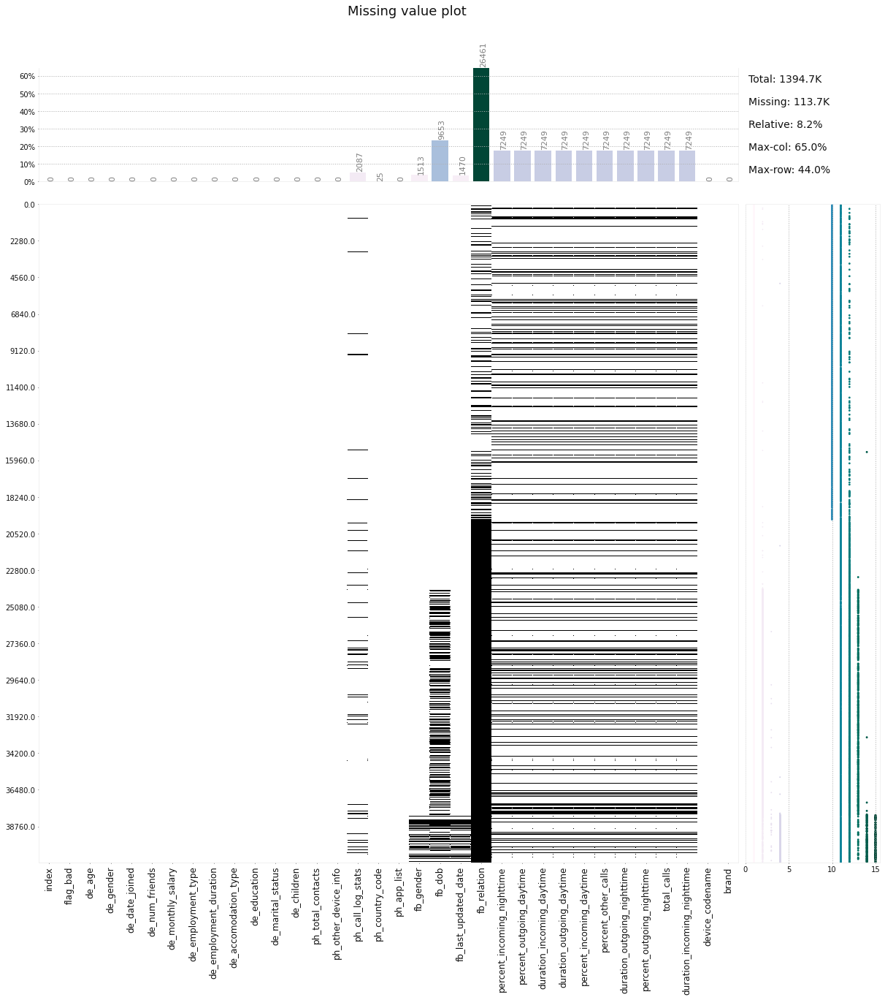

In [29]:
klib.missingval_plot(df)

### Observation :- 
* fb_dob - Date of Birth from Facebook have 23% null 
* fb_relation - Facebook No of relation have 64% null 
* From the above null plot, fb_gender,fb_dob & fb_last_updated_date are paired  to gather in missing data 


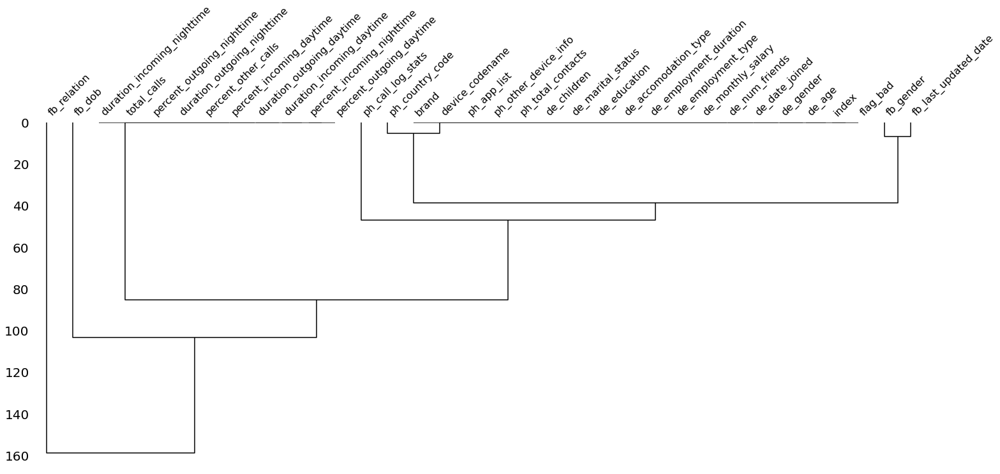

In [30]:
missingno.dendrogram(df)

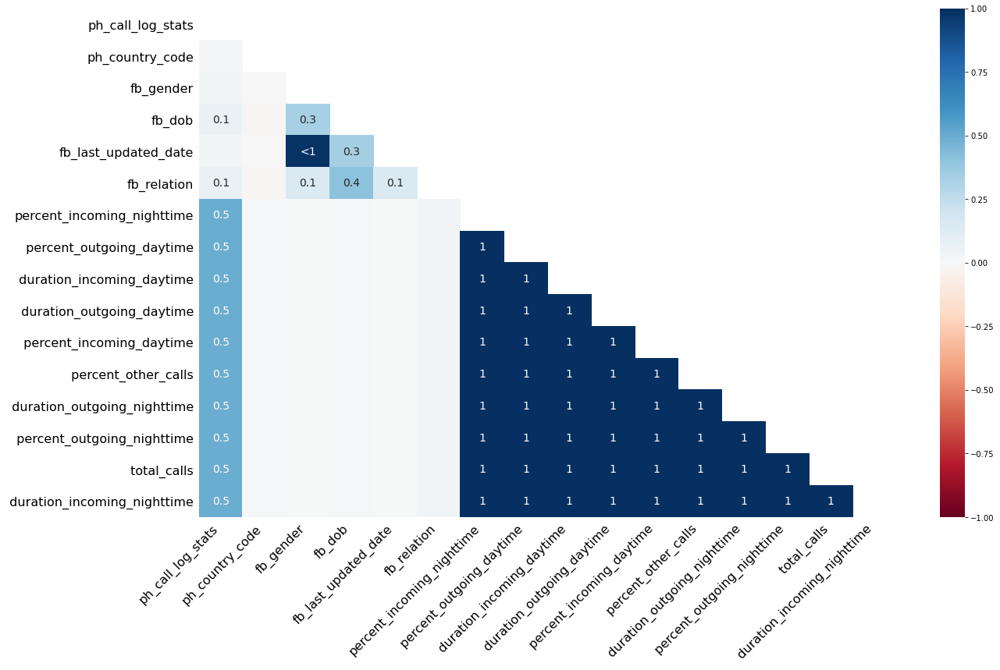

In [ ]:
missingno.heatmap(df)

In [22]:
df.columns

Index(['index', 'flag_bad', 'de_age', 'de_gender', 'de_date_joined',
       'de_num_friends', 'de_monthly_salary', 'de_employment_type',
       'de_employment_duration', 'de_accomodation_type', 'de_education',
       'de_marital_status', 'de_children', 'ph_total_contacts',
       'ph_other_device_info', 'ph_call_log_stats', 'ph_country_code',
       'ph_app_list', 'fb_gender', 'fb_dob', 'fb_last_updated_date',
       'fb_relation', 'percent_incoming_nighttime', 'percent_outgoing_daytime',
       'duration_incoming_daytime', 'duration_outgoing_daytime',
       'percent_incoming_daytime', 'percent_other_calls',
       'duration_outgoing_nighttime', 'percent_outgoing_nighttime',
       'total_calls', 'duration_incoming_nighttime', 'device_codename',
       'brand'],
      dtype='object')

In [32]:
num_field_to_fix = ['percent_incoming_nighttime',
       'percent_outgoing_daytime', 'duration_incoming_daytime',
       'duration_outgoing_daytime', 'percent_incoming_daytime',
       'percent_other_calls', 'duration_outgoing_nighttime',
       'percent_outgoing_nighttime', 'total_calls',
       'duration_incoming_nighttime']

for col in num_field_to_fix:
  df[col].fillna(df[col].median(),inplace=True)

### Lets Check Again the Phone Call logs is imputed with median or not

In [33]:
df.isnull().sum()/df.shape[0]*100

index                           0.000000
flag_bad                        0.000000
de_age                          0.000000
de_gender                       0.000000
de_date_joined                  0.000000
de_num_friends                  0.000000
de_monthly_salary               0.000000
de_employment_type              0.000000
de_employment_duration          0.000000
de_accomodation_type            0.000000
de_education                    0.000000
de_marital_status               0.000000
de_children                     0.000000
ph_total_contacts               0.000000
ph_other_device_info            0.000000
ph_call_log_stats               5.087514
ph_country_code                 0.060943
ph_app_list                     0.000000
fb_gender                       3.688265
fb_dob                         23.531276
fb_last_updated_date            3.583443
fb_relation                    64.504412
percent_incoming_nighttime      0.000000
percent_outgoing_daytime        0.000000
duration_incomin

# 5. Dependent Variable Analysis

In [34]:
df['flag_bad'].value_counts()

0    35702
1     5320
Name: flag_bad, dtype: int64

In [35]:
configure_plotly_browser_state()
source = df['flag_bad'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='Good Customer vs Bad Customer')
fig.show()

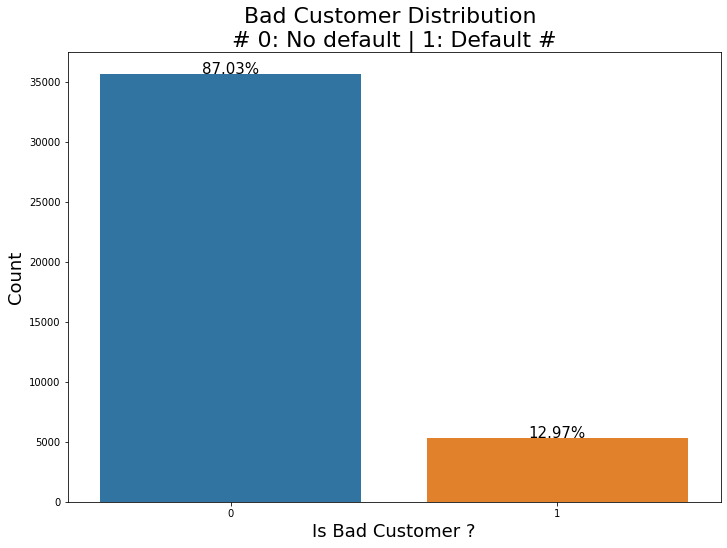

In [36]:
total = len(df)
g = sns.countplot(x='flag_bad', data=df, )
g.set_title("Bad Customer Distribution \n# 0: No default | 1: Default #", fontsize=22)
g.set_xlabel("Is Bad Customer ?", fontsize=18)
g.set_ylabel('Count', fontsize=18)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15) 
plt.show()

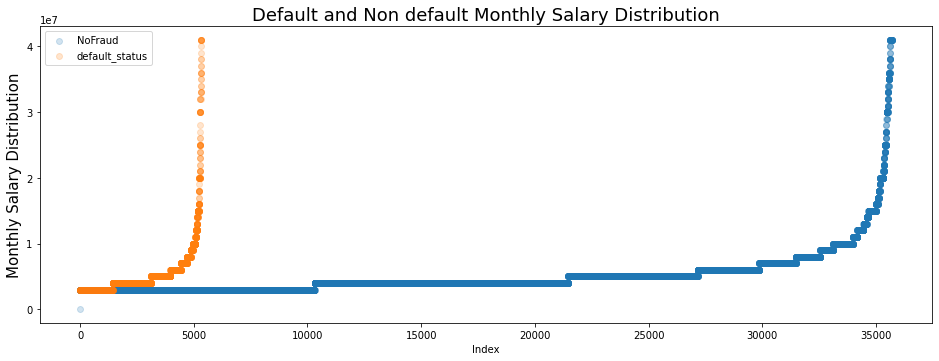

In [37]:
plt.figure(figsize=(16,12))
plt.subplot(212)
g4 = plt.scatter(range(df[df['flag_bad'] == 0].shape[0]),
                 np.sort(df[df['flag_bad'] == 0]['de_monthly_salary'].values), 
                 label='NoFraud', alpha=.2)
g4 = plt.scatter(range(df[df['flag_bad'] == 1].shape[0]),
                 np.sort(df[df['flag_bad'] == 1]['de_monthly_salary'].values), 
                 label='default_status', alpha=.2)
g4= plt.title("Default and Non default Monthly Salary Distribution", fontsize=18)
g4 = plt.xlabel("Index")
g4 = plt.ylabel("Monthly Salary Distribution", fontsize=15)
g4 = plt.legend()

### Observation :- 

* Its evident that if monthly salary is less , there is probability of default is high  
* For Model building - Train and Test data split need to specify the appropirate sampling strategy 
* 87.03 % Customers have good credit profile and 12.97% does not have good credit profile

# Lets Check Outliers in the Monthly Salary Field

In [38]:
def CalcOutliers(df_num): 

    print("===============================================")
    print("     OUTLIER PROFILE - ",df_num.name)
    print("==============================================")

    # calculating mean and std of the array
    data_mean, data_std = np.mean(df_num), np.std(df_num)

    # seting the cut line to both higher and lower values
    # You can change this value
    cut = data_std * 3
    df_num.median()

    #Calculating the higher and lower cut values
    lower, upper = data_mean - cut, data_mean + cut

    # creating an array of lower, higher and total outlier values 
    outliers_lower = [x for x in df_num if x < lower]
    outliers_higher = [x for x in df_num if x > upper]
    outliers_total = [x for x in df_num if x < lower or x > upper]

    # array without outlier values
    outliers_removed = [x for x in df_num if x > lower and x < upper]


    data_median = df_num.median()

    print('Mean                        : %d' % data_mean) # printing total number of values in lower cut of outliers
    print('Median                      : %d' % data_median) # printing total number of values in higher cut of outliers
    print('Standard Deviation          : %d' % data_std) # printing total number of values outliers of both sides
    print('Upper Cutoff                : %d' % abs(lower)) # printing total number of values outliers of both sides
    print('Lower Cutoff                : %d' % abs(upper)) # printing total number of values outliers of both sides
    print('Identified lowest outliers. : %d' % len(outliers_lower)) # printing total number of values in lower cut of outliers
    print('Identified upper outliers   : %d' % len(outliers_higher)) # printing total number of values in higher cut of outliers
    print('Total outlier observations. : %d' % len(outliers_total)) # printing total number of values outliers of both sides
    print('Non-outlier observations    : %d' % len(outliers_removed)) # printing total number of non outlier values
    print("Total percentual of Outliers:", round((len(outliers_total) / len(outliers_removed) )*100, 4)) # Percentual of outliers in points
    return

In [39]:
CalcOutliers(df['de_monthly_salary'])

     OUTLIER PROFILE -  de_monthly_salary
Mean                        : 5182706
Median                      : 4000000
Standard Deviation          : 3751260
Upper Cutoff                : 6071073
Lower Cutoff                : 16436486
Identified lowest outliers. : 0
Identified upper outliers   : 706
Total outlier observations. : 706
Non-outlier observations    : 40316
Total percentual of Outliers: 1.7512


Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.


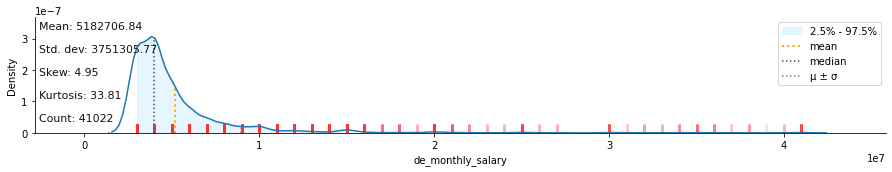

In [40]:
klib.dist_plot(df['de_monthly_salary'])

### Observation :- 
* There are 706 outliers in the dataset , While doing modeling Monthly salary need treatment 
* Monthly salary distribution has long right tail
* Median salary is IDR 4,000,000 where as Mean is greater than Median 

Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.


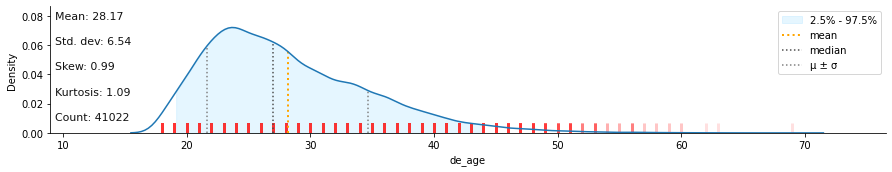

In [42]:
klib.dist_plot(df['de_age'])

In [ ]:
CalcOutliers(df['de_age'])

     OUTLIER PROFILE -  de_age
Mean                        : 28
Median                      : 27
Standard Deviation          : 6
Upper Cutoff                : 8
Lower Cutoff                : 47
Identified lowest outliers. : 0
Identified upper outliers   : 427
Total outlier observations. : 427
Non-outlier observations    : 40595
Total percentual of Outliers: 1.0519


### Observation :- 
* There are 427 outliers in the de_age , Its evident that there are Customer with Age > 47 applied for loans
* Monthly salary distribution has medium right tail
* Median Aprrox. equal to Median, Kurtosis and Skew is less 

### Good Credit history Customer's Age distribution

Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.
     OUTLIER PROFILE -  de_age
Mean                        : 28
Median                      : 27
Standard Deviation          : 6
Upper Cutoff                : 8
Lower Cutoff                : 47
Identified lowest outliers. : 0
Identified upper outliers   : 371
Total outlier observations. : 371
Non-outlier observations    : 35331
Total percentual of Outliers: 1.0501


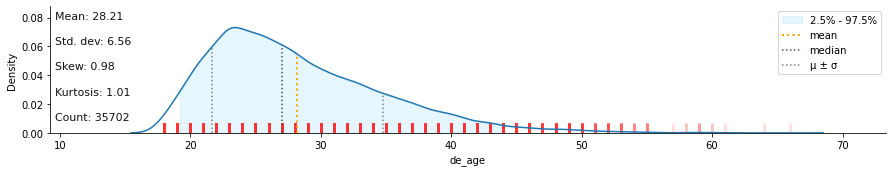

In [ ]:
klib.dist_plot(df.loc[df['flag_bad']==0]['de_age'])
CalcOutliers(df.loc[df['flag_bad']==0]['de_age'])

### Observation :- 
* There are 427 outliers in the de_age , Its evident that there are Customer with Age > 47 applied for loans
* Good Credit history Customer Age distribution has medium right tail
* Median Aprrox. equal to Median, Kurtosis and Skew is less 

### Bad Credit history Customer's Age distribution

     OUTLIER PROFILE -  de_age
Mean                        : 27
Median                      : 27
Standard Deviation          : 6
Upper Cutoff                : 8
Lower Cutoff                : 47
Identified lowest outliers. : 0
Identified upper outliers   : 56
Total outlier observations. : 56
Non-outlier observations    : 5264
Total percentual of Outliers: 1.0638


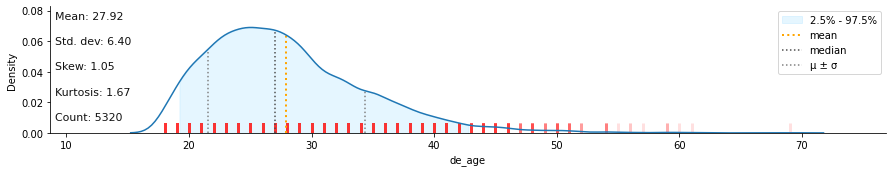

In [ ]:
klib.dist_plot(df.loc[df['flag_bad']==1]['de_age'])
CalcOutliers(df.loc[df['flag_bad']==1]['de_age'])

### Observation :- 
* There are 56 outliers in the de_age , Its evident that there are Customer with Age > 47 applied for credit loans has paid their dues 
* Good Credit history Customer Age distribution has medium right tail
* Median Aprrox. equal to Median, Kurtosis and Skew is less 

Analysing Call Duration for below fields 
'duration_incoming_daytime','duration_outgoing_daytime','duration_incoming_nighttime','duration_incoming_nighttime'

### duration_incoming_daytime Distribution

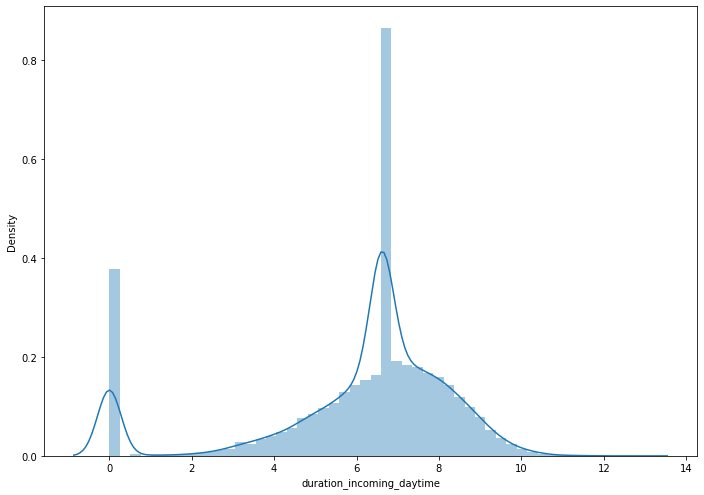

In [54]:
sns.distplot(np.log1p(df['duration_incoming_daytime']))

### duration_outgoing_daytime Distribution

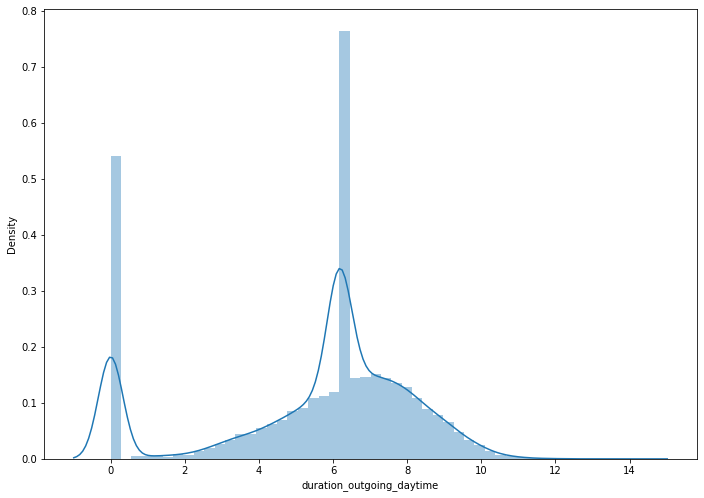

In [55]:
sns.distplot(np.log1p(df['duration_outgoing_daytime']))

### duration_incoming_nighttime Distribution 

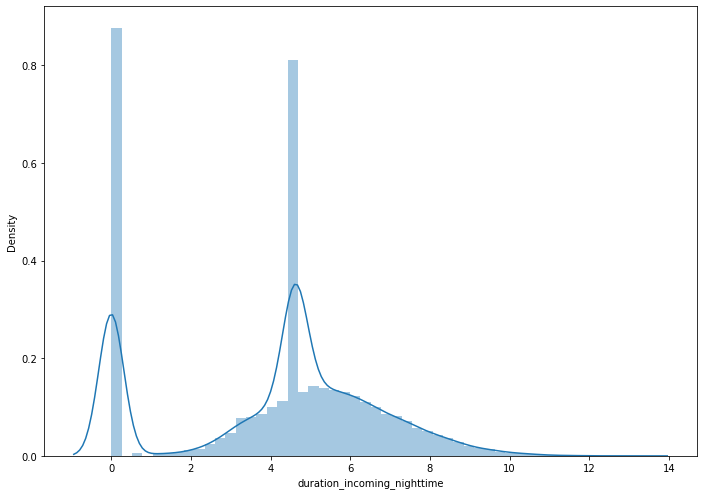

In [56]:
sns.distplot(np.log1p(df['duration_incoming_nighttime']))

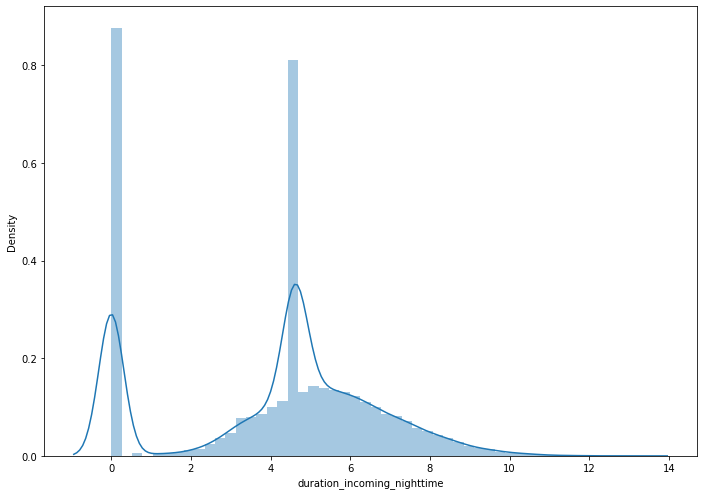

In [57]:
sns.distplot(np.log1p(df['duration_incoming_nighttime']))

### Observation :- 

Phone Call duration fields ('duration_incoming_daytime','duration_outgoing_daytime','duration_incoming_nighttime','duration_incoming_nighttime') have double peak , To make this field more meaning full we need to split it based on the means or removing the outliers in the fields 

### Open Question :- 
Many values are negative,Before going to use it in Modeing ,I am very curious to know why the Phone Call duration is negative for customer 

In [ ]:
default_gender_age = df.groupby(['flag_bad','de_gender']).agg({'index':'count','de_age':'mean'}).reset_index().rename(columns={'index':'count','de_age':'Avg Age'})

In [ ]:
default_gender_age

,flag_bad,de_gender,count,Avg Age
0,0,1,21574,28.858533
1,0,2,14128,27.215742
2,1,1,3512,28.151196
3,1,2,1808,27.467920


In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_employment_type", y="de_age", points="all",color="flag_bad")
fig.show()

In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_employment_type", y="de_monthly_salary", points="all",color="flag_bad")
fig.show()

In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_employment_type", y="de_num_friends", points="all",color="flag_bad")
fig.show()

In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_children", y="de_monthly_salary", points="all",color="flag_bad")
fig.show()

In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_children", y="de_employment_duration", points="all",color="flag_bad")
fig.show()

In [ ]:
configure_plotly_browser_state()
fig = px.box(df, x="de_education", y="de_employment_duration", points="all",color="flag_bad")
fig.show()

In [58]:
configure_plotly_browser_state()
fig = px.box(df, x="de_marital_status", y="de_employment_duration", points="all",color="flag_bad")
fig.show()

#  7. Bivariate Analysis

In [44]:
df['de_date_joined'] = pd.to_datetime(df['de_date_joined']).dt.date

In [45]:
 def add_date_features(df,date_col):
    df[date_col] = pd.to_datetime(df[date_col])
    df[date_col+'_month'] = df[date_col].dt.month
    df[date_col+'_year'] = df[date_col].dt.year
    df[date_col+'_week'] = df[date_col].dt.weekofyear
    df[date_col+'_dayofweek'] = df[date_col].dt.dayofweek
    df[date_col+'_days'] = (datetime.date(2009, 10, 1) - df[date_col].dt.date).dt.days
    df[date_col+'_quarter'] = df[date_col].dt.quarter
    df[date_col+'_month_start'] = df[date_col].dt.is_month_start
    return df

In [46]:
df = add_date_features(df,'de_date_joined')

In [47]:
cust_joined_dt_smmry = df.groupby(['de_date_joined']).agg({'index':'count'}).reset_index().rename(columns={'index':'Total Customers'})

In [48]:
configure_plotly_browser_state()
fig = px.line(cust_joined_dt_smmry, x="de_date_joined", y="Total Customers", title='Customers Joined Trend')
fig.show()

In [49]:
cust_joined_dt_smmry_flag_bad = df.groupby(['de_date_joined','flag_bad']).agg({'index':'count'}).reset_index().rename(columns={'index':'Total Customers'})
configure_plotly_browser_state()
fig = px.line(cust_joined_dt_smmry_flag_bad, x="de_date_joined", y="Total Customers",color='flag_bad',title='Customers Joined Trend - Good & Bad Credits')
fig.show()

In [50]:
cust_joined_dt_smmry_gender = df.groupby(['de_date_joined','flag_bad','de_gender']).agg({'index':'count'}).reset_index().rename(columns={'index':'Total Customers'})
configure_plotly_browser_state()
fig = px.line(cust_joined_dt_smmry_gender, x="de_date_joined", y="Total Customers",color='de_gender',title='Customers Joined Trend - Male Vs Female')
fig.show()

In [51]:
cust_joined_dt_smmry_edu = df.groupby(['de_date_joined','flag_bad','de_education']).agg({'index':'count'}).reset_index().rename(columns={'index':'Total Customers'})
configure_plotly_browser_state()
fig = px.line(cust_joined_dt_smmry_edu, x="de_date_joined", y="Total Customers",color='de_education',title='Customers Joined Trend - Education')
fig.show()

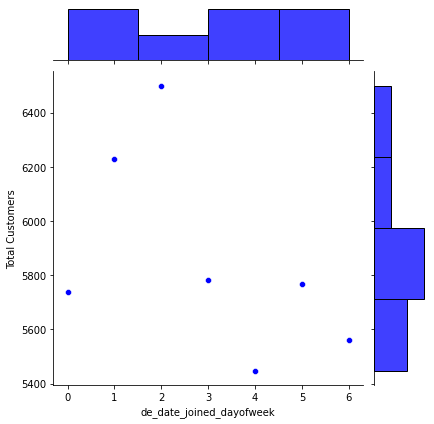

In [ ]:
customer_joined_day = df.groupby(['de_date_joined_dayofweek']).agg({'index':'count'}).reset_index().rename(columns={'index':'Total Customers'})
sns.jointplot(customer_joined_day['de_date_joined_dayofweek'],customer_joined_day['Total Customers'],color='blue')

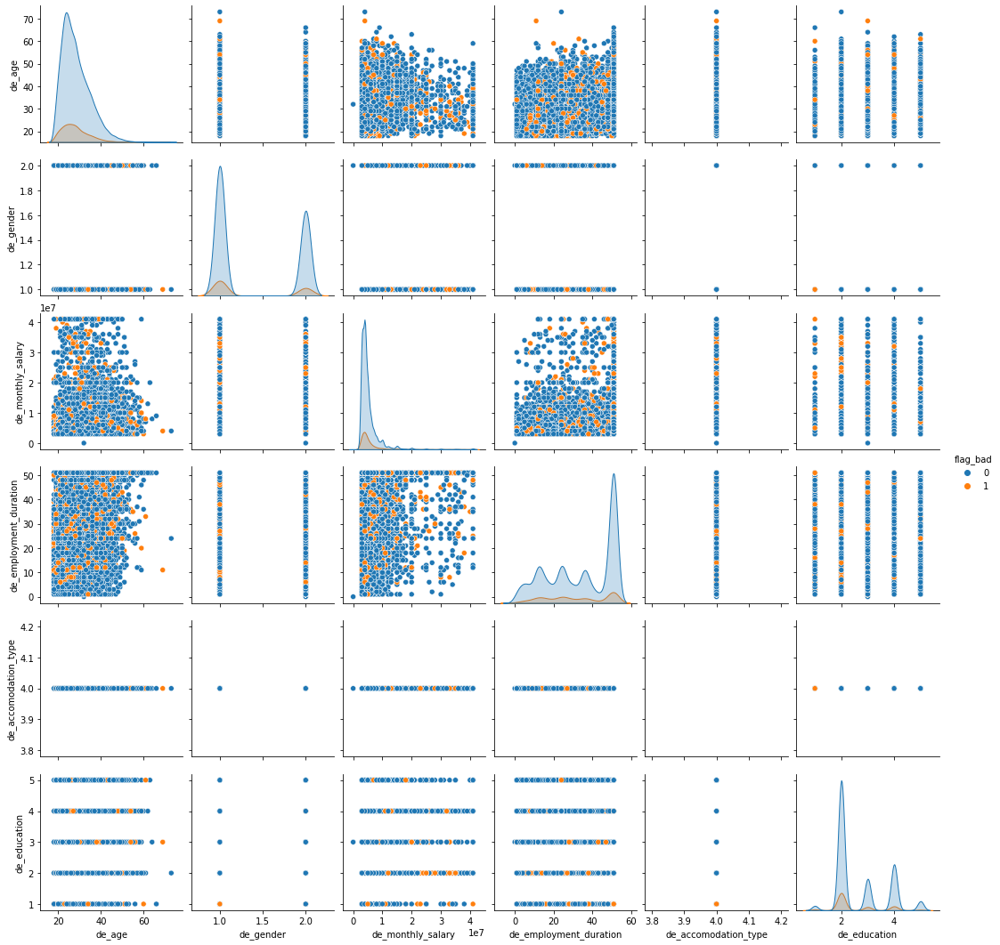

In [ ]:
sns.pairplot(df[['flag_bad','de_age', 'de_gender','de_monthly_salary','de_employment_duration', 'de_accomodation_type', 'de_education']],hue='flag_bad')

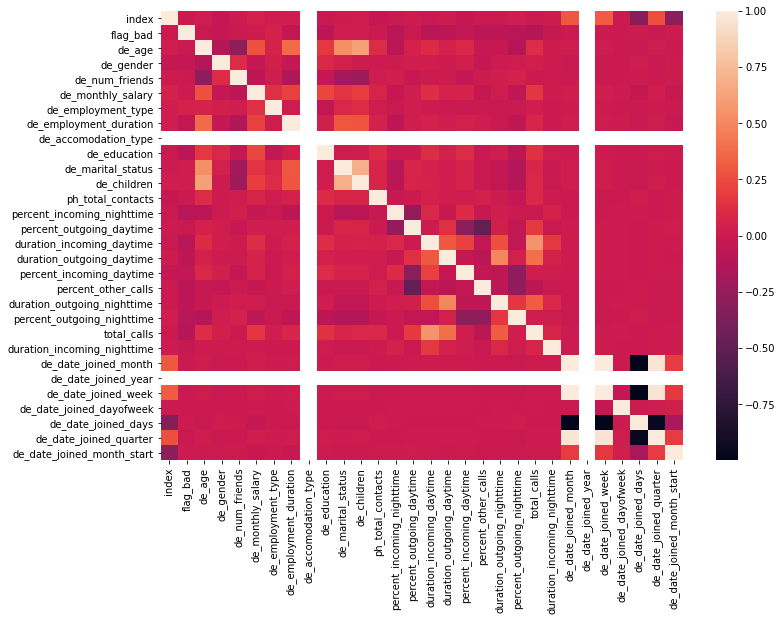

In [ ]:
sns.heatmap(df.corr())

In [ ]:
df.columns

Index(['index', 'flag_bad', 'de_age', 'de_gender', 'de_date_joined',
       'de_num_friends', 'de_monthly_salary', 'de_employment_type',
       'de_employment_duration', 'de_accomodation_type', 'de_education',
       'de_marital_status', 'de_children', 'ph_total_contacts',
       'ph_other_device_info', 'ph_call_log_stats', 'ph_country_code',
       'ph_app_list', 'fb_gender', 'fb_dob', 'fb_last_updated_date',
       'fb_relation', 'percent_incoming_nighttime', 'percent_outgoing_daytime',
       'duration_incoming_daytime', 'duration_outgoing_daytime',
       'percent_incoming_daytime', 'percent_other_calls',
       'duration_outgoing_nighttime', 'percent_outgoing_nighttime',
       'total_calls', 'duration_incoming_nighttime', 'device_codename',
       'brand', 'de_date_joined_month', 'de_date_joined_year',
       'de_date_joined_week', 'de_date_joined_dayofweek',
       'de_date_joined_days', 'de_date_joined_quarter',
       'de_date_joined_month_start'],
      dtype='object')

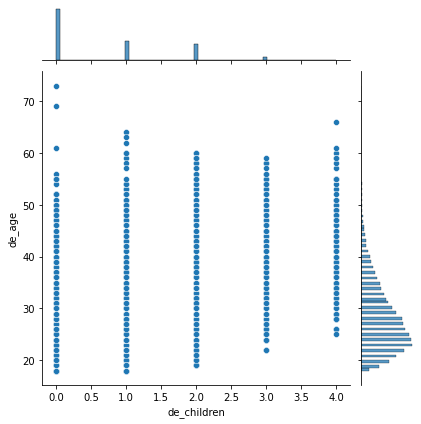

In [ ]:
sns.jointplot(df['de_children'],df['de_age'])

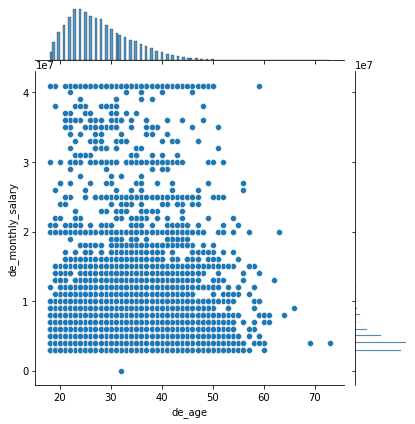

In [ ]:
sns.jointplot(df['de_age'],df['de_monthly_salary'])

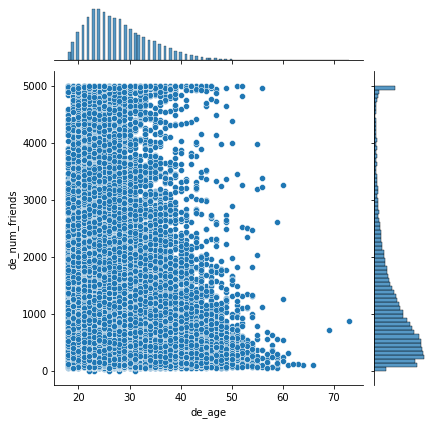

In [ ]:
sns.jointplot(df['de_age'],df['de_num_friends'])

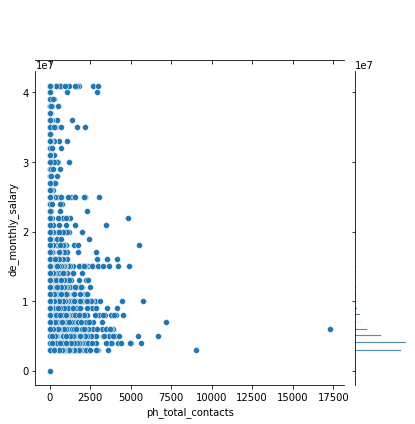

In [ ]:
sns.jointplot(df['ph_total_contacts'],df['de_monthly_salary'])

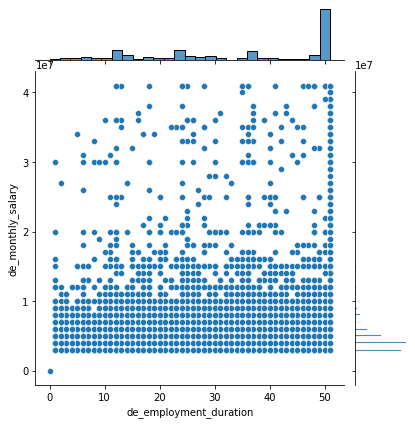

In [ ]:
sns.jointplot(df['de_employment_duration'],df['de_monthly_salary'])

In [ ]:
df.columns

Index(['index', 'flag_bad', 'de_age', 'de_gender', 'de_date_joined',
       'de_num_friends', 'de_monthly_salary', 'de_employment_type',
       'de_employment_duration', 'de_accomodation_type', 'de_education',
       'de_marital_status', 'de_children', 'ph_total_contacts',
       'ph_other_device_info', 'ph_call_log_stats', 'ph_country_code',
       'ph_app_list', 'fb_gender', 'fb_dob', 'fb_last_updated_date',
       'fb_relation', 'percent_incoming_nighttime', 'percent_outgoing_daytime',
       'duration_incoming_daytime', 'duration_outgoing_daytime',
       'percent_incoming_daytime', 'percent_other_calls',
       'duration_outgoing_nighttime', 'percent_outgoing_nighttime',
       'total_calls', 'duration_incoming_nighttime', 'device_codename',
       'brand', 'de_date_joined_month', 'de_date_joined_year',
       'de_date_joined_week', 'de_date_joined_dayofweek',
       'de_date_joined_days', 'de_date_joined_quarter',
       'de_date_joined_month_start'],
      dtype='object')

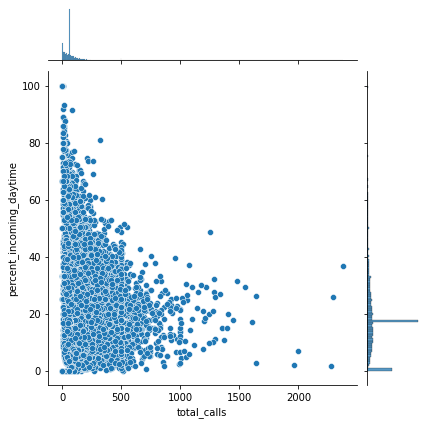

In [ ]:
sns.jointplot(df['total_calls'],df['percent_incoming_daytime'])

## Phone Call Log , Correlation with Target Variable

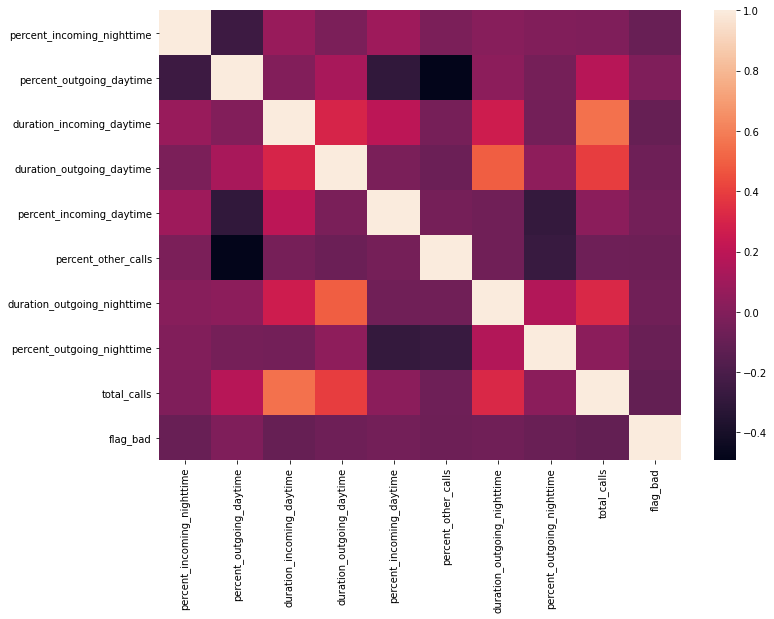

In [ ]:
sns.heatmap(df[['percent_incoming_nighttime', 'percent_outgoing_daytime',
       'duration_incoming_daytime', 'duration_outgoing_daytime',
       'percent_incoming_daytime', 'percent_other_calls',
       'duration_outgoing_nighttime', 'percent_outgoing_nighttime',
       'total_calls','flag_bad']].corr())